<a href="https://colab.research.google.com/github/anilaksu/AI-and-Data-Science-Codes/blob/main/Udemy_Data_Science_Training_part_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Complete Machine Learning & Data Science Bootcamp 2023 Udemy Training Part 2**


Anil Aksu

Personal e-mail: aaa293@cornell.edu


## Notebook Organization:
- **Image Classification Neural Networks**
- **Story telling for Data Science**
  






#1.Neural Networks: Deep Learning, Transfer Learning and TensorFlow 2

What is TensorFlow?
* A library that allows to perform a deep-learning model on unstructured data.

Why TensorFlow?
1.   Write fast deep learning code in Python (able to run on a GPU)
2.   Able to access many pre-built deep learning models
3.   Whole stack: preprocess, model, and deploy
4. Originally designed and used in-house by Google





In [1]:
# Here we set our working directory in our google drive to access datasets externally
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/ColabNotebooks/DataScienceUdemyTraining/DogVision

Mounted at /content/drive
/content/drive/MyDrive/ColabNotebooks/DataScienceUdemyTraining/DogVision


In [ ]:
import os
import zipfile

local_zip = 'bluebook-for-bulldozers.zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')

zip_ref.extractall('.') # extract all data into current working directory
zip_ref.close()

FileNotFoundError: ignored

##1.1 End-to-end Multiclass Dog Breed Classification
This notebook builds an end-to-end multi-class image classifier usibng TensoFlow 2.0 and TensorFlow Hub.


1.   **Problem**: Identifying the breed of a dog given an image of a dog.
2.   **Data**: The data we are using is from Kaggle's dog breed identification in the [link](https://www.kaggle.com/competitions/dog-breed-identification/data)
3.  **Evaluation**: The file with prediction probabilities.
4.  **Features**:  



In [2]:
# Import TensorFlow into Colab
import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.15.0


In [3]:
# Import TensorFlow Hub
import tensorflow_hub as hub
print("TF hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available (YESSSS!!!!)" if tf.config.list_logical_devices else "not available :(")

TF hub version: 0.15.0
GPU available (YESSSS!!!!)


In [4]:
## Getting our data ready (turning into Tensors)
import numpy as np
import pandas as pd
labels_csv = pd.read_csv("labels.csv")
print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

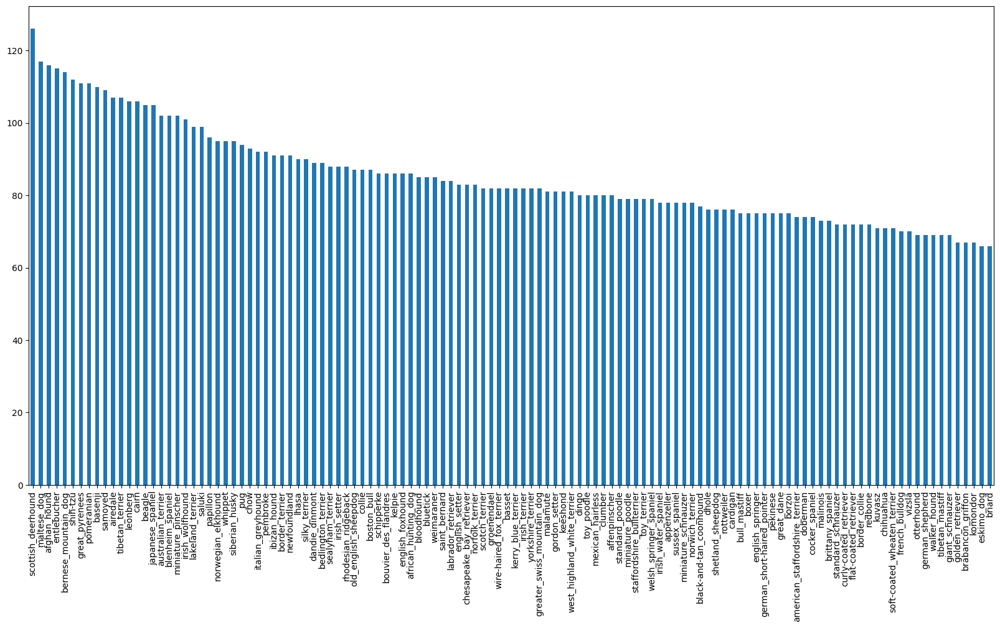

In [5]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

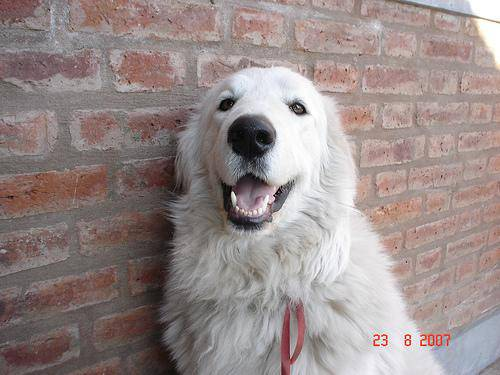

In [6]:
# Let's view an image
from IPython.display import Image
Image("train/0a0c223352985ec154fd604d7ddceabd.jpg")

In [7]:
# Getting images and their labels

# Create pathnames from image ID's
filenames = ["train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'train/001cdf01b096e06d78e9e5112d419397.jpg',
 'train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'train/002a283a315af96eaea0e28e7163b21b.jpg',
 'train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [8]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files!!! Proceed.


In [9]:
labels = labels_csv["breed"].to_numpy()
len(labels)

10222

In [10]:
# See if number of labels matches the number of file
if len(labels) == len(filenames):
  print("Number of labels match actual amount of filenames!")
else:
  print("Number of labels do not match actual amount of files, check the target directory.")

Number of labels match actual amount of filenames!


In [11]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [12]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [13]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # Index where label occurs
print(boolean_labels[0].argmax()) # Index where label occures in boolean array
print(boolean_labels[0].astype(int)) # There will be a 1 where

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [14]:
# Setup X & y variables
X = filenames
y = boolean_labels
# We are going to start off experimenting with 1000 images for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000}

In [15]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split data into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES],
                                                   test_size = 0.2, random_state = 42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

##1.2 Preprocessing Images (turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image`to be a shape of (224,224)
5. Return the modified `image`

In [16]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[41])
image.shape

(375, 500, 3)

In [17]:
# Here we turn image into tensor
tf.constant(image)

<tf.Tensor: shape=(375, 500, 3), dtype=uint8, numpy=
array([[[ 63,  52,  24],
        [ 62,  51,  23],
        [ 60,  48,  22],
        ...,
        [ 60,  41,  26],
        [ 62,  43,  28],
        [ 63,  44,  29]],

       [[ 64,  53,  25],
        [ 63,  52,  24],
        [ 61,  49,  23],
        ...,
        [ 61,  42,  27],
        [ 62,  43,  28],
        [ 64,  45,  30]],

       [[ 65,  54,  26],
        [ 64,  53,  25],
        [ 62,  50,  24],
        ...,
        [ 62,  43,  28],
        [ 63,  44,  29],
        [ 64,  45,  30]],

       ...,

       [[ 13,   6,   0],
        [ 18,  11,   1],
        [ 26,  17,  10],
        ...,
        [193, 166,  79],
        [197, 170,  83],
        [199, 172,  85]],

       [[ 21,  14,   4],
        [ 21,  14,   4],
        [ 22,  13,   6],
        ...,
        [196, 168,  84],
        [201, 173,  90],
        [204, 176,  92]],

       [[ 25,  18,   8],
        [ 20,  13,   3],
        [ 18,   9,   2],
        ...,
        [201, 173,  9

In [18]:
# Let's make a function to preprocess images
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path):
  """
  Takes an image file path and turns the image into a Tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpes image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels = 3)
  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image

print(process_image.__doc__)


  Takes an image file path and turns the image into a Tensor
  


##1.3 Turning our data into batches

Why turn our data into batches?

Let's say you are trying to process 10,000+ images in on go... they might not fit into memory

So that's why we do about 32 (this is the batch size) images at a time, you can manually adjust the batch size if need be.

In order to use TensorFlow effectively, we need our data in the form of Tensor which look like: `(image, label)`

In [19]:
# Create a simple function to return a tuple (image, tuple)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """

  image = process_image(image_path)
  return image, label

In [20]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batcehs
def create_data_batches(X, y=None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data out of image (X) and label (y) pairs
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have lables
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slice((tf.constant(X))) # only filepaths (nonlabels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  # IF the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepaths
                                               tf.constant(y))) # labels
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size = len(X))
    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)
    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
    return data_batch

In [21]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data = True)

Creating training data batches...
Creating validation data batches...


In [22]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

###1.3.1 Visualizing Data Batches

Our data is now in batches, however, these can be a little hard to understand, let's visualize the batches

In [23]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """

  # Setup the figure
  plt.figure(figsize = (10,10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [24]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

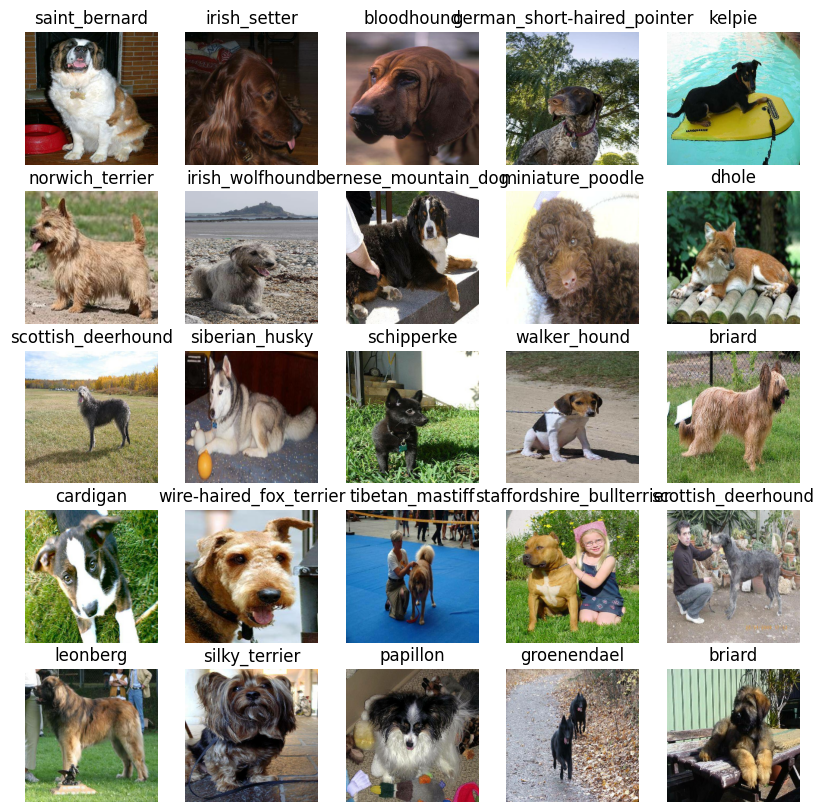

In [25]:
# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

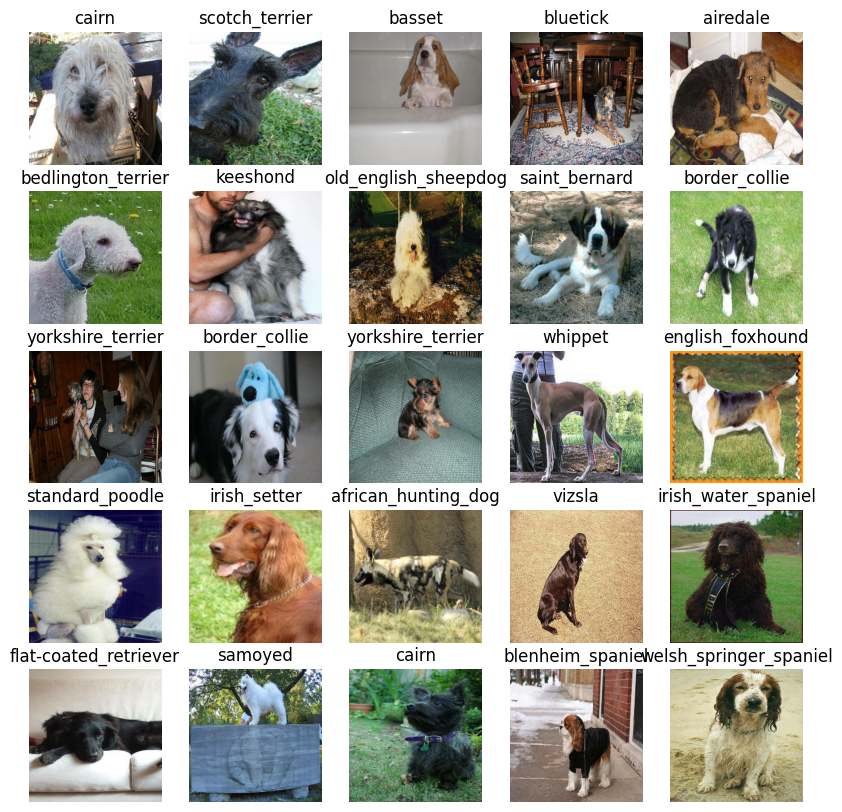

In [26]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

##1.4 Building a model

Before we build a model, there are a few things we need to define:
* The input share (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use:

  1.   https://pytorch.org/hub/
  2.   https://www.kaggle.com/models?tfhub-redirect=true
  3.   https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1?tfhub-redirect=true
  4.   https://paperswithcode.com/
  5. https://tfhub.dev




In [27]:
#Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [28]:
# Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

# Create a function which builds a Keras model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                            activation = "softmax") # Layer 2 (output layer)
  ])
  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [29]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


##1.5 Creating Callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks:
* One for TensorBoard which helps track our models progress
* Another for early stopping which prevents our model from training too long

In [30]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [31]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for sorting TensorBoard logs
  logdir = os.path.join("logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

##1.5.1 Early stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [32]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                                  patience = 3)

##1.6 Training Your Deep Neural Network

Our first model is only going to train on 1000 images, to make sure everything is working

In [33]:
NUM_EPOCHS = 100 #@param{type:"slider", min:10, max:100, step:10}


In [34]:
# Let's check if we use GPU again
print("GPU", "available (YES!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YES!!!)


In [35]:
# Let's create a function which trains a model

def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()
  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])
  # Return the fitted model
  return model

In [36]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 214s 8s/step - loss: 4.5606 - accuracy: 0.0850 - val_loss: 3.3959 - val_accuracy: 0.2900
Epoch 2/100
25/25 [==============================] - 4s 175ms/step - loss: 1.6419 - accuracy: 0.6750 - val_loss: 2.1524 - val_accuracy: 0.5250
Epoch 3/100
25/25 [==============================] - 3s 114ms/step - loss: 0.5821 - accuracy: 0.9362 - val_loss: 1.6935 - val_accuracy: 0.6100
Epoch 4/100
25/25 [==============================] - 3s 118ms/step - loss: 0.2565 - accuracy: 0.9875 - val_loss: 1.5119 - val_accuracy: 0.6450
Epoch 5/100
25/25 [==============================] - 5s 193ms/step - loss: 0.1498 - accuracy: 0.9987 - val_loss: 1.4417 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 3s 110ms/step - loss: 0.1022 - accuracy: 1.0000 - val_loss: 1.3930 - val_accuracy: 0.6600
Epoch 7/100
25/25 [==============================]

##1.7 Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard%`) will access the logs directory we created earlier and visualize its contents.

In [37]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

##1.8 Making and evaluating predictions using a trained model

In [38]:
# Make predictions on the validation data
predictions = model.predict(val_data, verbose = 1)
predictions

7/7 [==============================] - 1s 73ms/step


array([[5.22059796e-04, 9.21476239e-05, 4.63585602e-03, ...,
        1.22756843e-04, 1.14689188e-04, 1.28333340e-03],
       [1.00863585e-02, 1.27705885e-03, 3.88996564e-02, ...,
        7.73927022e-04, 2.03036573e-02, 1.65980461e-03],
       [5.05722574e-06, 8.67170311e-05, 6.91897048e-06, ...,
        2.94172380e-04, 1.08046923e-04, 1.13210024e-03],
       ...,
       [6.79349341e-06, 2.92324141e-04, 6.82228827e-04, ...,
        3.56216115e-05, 7.38846604e-04, 4.04121995e-04],
       [5.38446428e-03, 7.24221100e-05, 5.47688338e-04, ...,
        8.96670244e-05, 3.41259612e-04, 1.14560938e-02],
       [3.50055518e-04, 2.59629433e-05, 7.13008689e-04, ...,
        1.07866293e-03, 6.46539498e-04, 1.63995050e-04]], dtype=float32)

In [39]:
predictions.shape

(200, 120)

In [40]:
len(y_val)

200

In [41]:
np.sum(predictions[0])
np.sum(predictions[1])

1.0000001

In [42]:
len(unique_breeds)

120

In [43]:
# First prediction
index = 42
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[5.22059796e-04 9.21476239e-05 4.63585602e-03 1.87494516e-04
 3.46572720e-04 5.22830778e-05 2.33019851e-02 2.13026986e-04
 3.01764176e-05 9.78152035e-04 6.63963496e-04 7.80248374e-05
 2.90348311e-04 1.30769229e-04 3.26842070e-04 6.54361444e-04
 6.15779136e-05 4.13345635e-01 4.48439387e-05 2.86642571e-05
 2.02283190e-04 1.79594514e-04 6.39168957e-06 3.07397684e-03
 1.50931170e-04 1.28297787e-03 5.39029911e-02 7.18841329e-04
 4.50020452e-04 7.10838998e-04 2.66851275e-04 1.27571181e-03
 1.30364555e-03 3.99434539e-05 5.73186517e-05 5.46354800e-02
 2.44497642e-04 9.48097659e-05 3.65150008e-05 5.04748197e-04
 1.33820821e-03 7.07774370e-06 4.18691838e-04 1.25294828e-04
 1.73223489e-05 5.76762177e-05 1.76247704e-04 9.28404042e-05
 4.90033824e-04 2.25259602e-04 9.00120795e-05 1.57151153e-04
 4.47076833e-04 7.32693079e-05 7.01439349e-05 3.63891922e-05
 3.05448397e-04 3.03867715e-03 1.37923390e-03 1.86353639e-01
 1.60068317e-04 2.46306372e-05 6.88525382e-04 2.13336498e-05
 3.88132699e-04 1.058814

In [44]:
unique_breeds[39]

'english_foxhound'

Having the above functionality is great butwe want to be able to do it at scale.


In [37]:
# Turn prediction probabilities into their respective label
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """

  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

NameError: ignored

Now since our validation data is still in a batch dataset, we'll have to unbatchinfy it to make predictions on the validation images and then compara those predictions to the validation labels (truth labels).

In [36]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in val_data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels


In [47]:
# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we'got ways to get:

*   Prediction labels
*   Validation labels (truth labels)
*   Validation images

Let's make some function to make these more visual

In [38]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """

  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"


  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{}{:2.0f}%{}".format(pred_label,
                                  np.max(pred_prob) * 100,
                                  true_label),
                                  color = color)

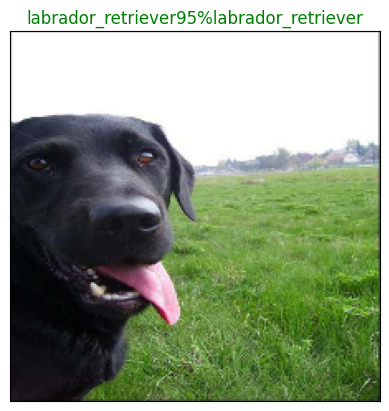

In [49]:
plot_pred(prediction_probabilities= predictions,
          labels = val_labels,
          images = val_images,
          n = 40)

Now we got one function to visualize our models top prediction, let's make another to view our models top 10 prediction.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probablities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 predition probabilit values and labels, coloring the true label green

In [50]:
def plot_pred_conf(prediction_probabilities, labels, n = 1):
  """
  Plus the top 10 highest prediction confidence along with the truth label for sample n
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

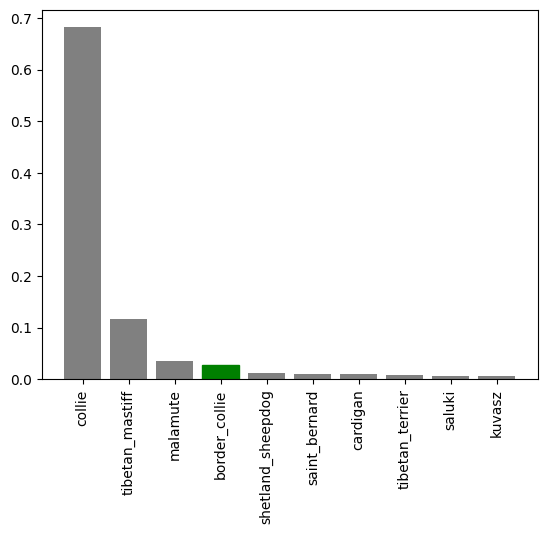

In [51]:
plot_pred_conf(prediction_probabilities=predictions,
               labels = val_labels,
               n = 9)

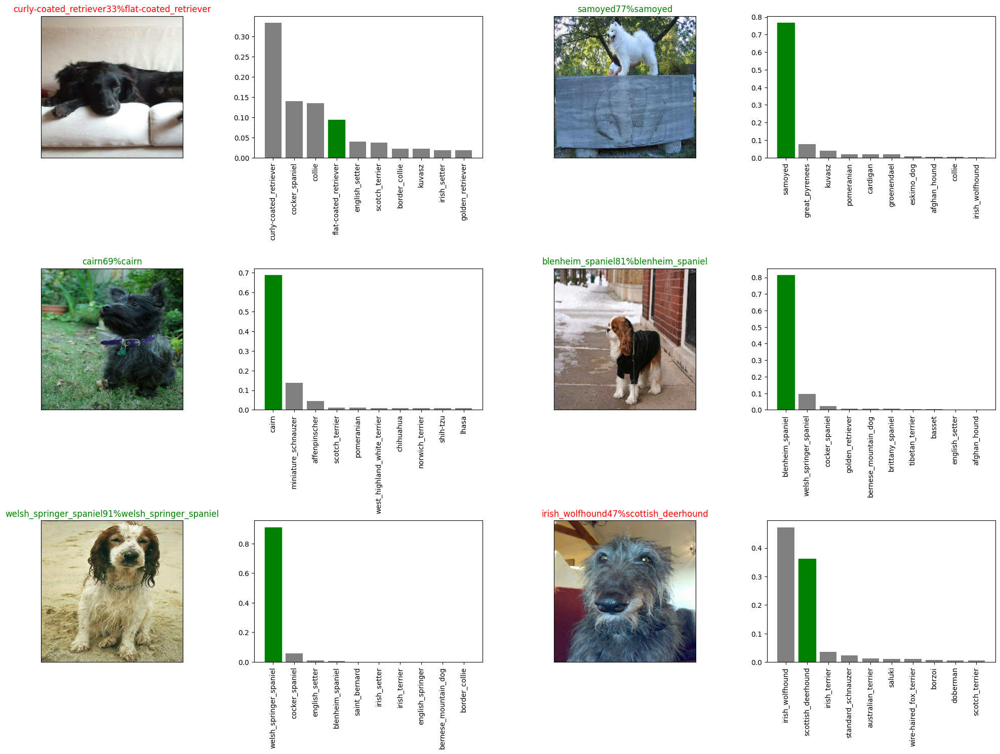

In [52]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize = (10 * num_cols, 5 * num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2* num_cols, 2 * i +1)
  plot_pred(prediction_probabilities = predictions,
            labels = val_labels,
            images = val_images,
            n = i + i_multiplier)
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
  plot_pred_conf(prediction_probabilities = predictions,
                 labels = val_labels,
                 n = i + i_multiplier)

plt.tight_layout(h_pad = 1.0) # Here we organize plots in a pad
plt.show()

##1.9 Saving and reloading a trained model

In [44]:
# Create a function to save a model
def save_model(model, suffix = None):
  """
  Saves a given model in a models directory and appends a suffix (string)
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [45]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer": hub.KerasLayer})
  return model


Now we got functions to save and load a trained model, let's make sure they work

In [56]:
# Save our model trained on 1000 images
save_model(model, suffix="100-images-mobilenetv2-Adam")

Saving model to: models/20240104-09371704361070-100-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'models/20240104-09371704361070-100-images-mobilenetv2-Adam.h5'

In [59]:
# Load a trained model
loaded_1000_image_model = load_model('models/20240104-09371704361070-100-images-mobilenetv2-Adam.h5')

Loading saved model from: models/20240104-09371704361070-100-images-mobilenetv2-Adam.h5


In [60]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 126ms/step - loss: 1.3130 - accuracy: 0.6650


[1.3130464553833008, 0.6650000214576721]

In [61]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 105ms/step - loss: 1.3130 - accuracy: 0.6650


[1.3130464553833008, 0.6650000214576721]

##1.10 Training Model On Full Dataset

In [39]:
# Create a data batch with the full data set
full_data = create_data_batches(X,y)

Creating training data batches...


In [40]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [41]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping  = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                              patience = 3)


In [42]:
# Fit the full model to the full data
full_model.fit(x = full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1584s 5s/step - loss: 1.3455 - accuracy: 0.6674
Epoch 2/100
320/320 [==============================] - 25s 79ms/step - loss: 0.4015 - accuracy: 0.8829
Epoch 3/100
320/320 [==============================] - 27s 83ms/step - loss: 0.2383 - accuracy: 0.9370
Epoch 4/100
320/320 [==============================] - 28s 88ms/step - loss: 0.1554 - accuracy: 0.9630
Epoch 5/100
320/320 [==============================] - 28s 88ms/step - loss: 0.1088 - accuracy: 0.9766
Epoch 6/100
320/320 [==============================] - 28s 87ms/step - loss: 0.0785 - accuracy: 0.9867
Epoch 7/100
320/320 [==============================] - 26s 82ms/step - loss: 0.0588 - accuracy: 0.9913
Epoch 8/100
320/320 [==============================] - 26s 81ms/step - loss: 0.0457 - accuracy: 0.9945
Epoch 9/100
320/320 [==============================] - 27s 85ms/step - loss: 0.0364 - accuracy: 0.9968
Epoch 10/100
320/320 [==============================] - 28s 86ms/step - l

In [46]:
# Save our model trained on 1000 images
save_model(model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: models/20240104-11131704366808-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'models/20240104-11131704366808-full-image-set-mobilenetv2-Adam.h5'

In [47]:
# Load a trained model
loaded_full_image_model = load_model('models/20240104-11131704366808-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: models/20240104-11131704366808-full-image-set-mobilenetv2-Adam.h5
